# Machine Learning Model to predic land price in Colombia

In [1]:
import pandas as pd

In [2]:
df = pd.read_csv(r'D:\IGAC_2024\Procesamiento\ML_model\Transaccion_variables_v2.txt',sep=';', encoding='latin1')

In [3]:
df.head()

,ID,TR_LATITUD,TR_LONGITU,CODIGO_PRE,DESTINO_EC,AREA_TERRE,AREA_CONST,VLR_ha_TER,FECHA,Vias_300m,Aguas_300,leyenda,ValorPotencial,Tipo
0,SNR080780057,"10,813547620000000","-74,911580099999995",080780001000000000057000000000,AGROPECUARIO,72900,87,"42304792,810000002384186",2021,NO,NO,2.4.2. Mosaico de pastos y cultivos,67,NaN
1,SNR080780058,"10,811228610000001","-74,908513709999994",080780001000000000058000000000,AGROPECUARIO,57281,286,"53840180,789999999105930",2021,NO,SI,2.3.1. Pastos limpios,67,NaN
2,SNR080780103,"10,812004180000001","-74,908136360000000",080780001000000000103000000000,AGROPECUARIO,57281,52,"53840180,789999999105930",2021,NO,SI,2.3.1. Pastos limpios,67,NaN
3,SNR080780104,"10,812582500000000","-74,907512780000005",080780001000000000104000000000,AGROPECUARIO,57281,0,"53840180,789999999105930",2021,NO,SI,2.3.1. Pastos limpios,67,NaN
4,SNR080780198,"10,815857919999999","-74,913047000000006",080780001000000000198000000000,AGROPECUARIO,3150,0,"219545160,210000008344650",2023,SI,NO,2.4.2. Mosaico de pastos y cultivos,61,NaN


### Cleaning Data

The first step is to check the column data types and identify if there are any null values.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169451 entries, 0 to 169450
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   ID              169451 non-null  object
 1   TR_LATITUD      169451 non-null  object
 2   TR_LONGITU      169451 non-null  object
 3   CODIGO_PRE      169451 non-null  object
 4   DESTINO_EC      169451 non-null  object
 5   AREA_TERRE      169451 non-null  int64 
 6   AREA_CONST      169451 non-null  int64 
 7   VLR_ha_TER      169451 non-null  object
 8   FECHA           169451 non-null  int64 
 9   Vias_300m       169451 non-null  object
 10  Aguas_300       169451 non-null  object
 11  leyenda         169335 non-null  object
 12  ValorPotencial  169381 non-null  object
 13  Tipo            44745 non-null   object
dtypes: int64(3), object(11)
memory usage: 18.1+ MB


In [5]:
# Replace null values in the 'Tipo' column with the string 'Null'
df['Tipo'] = df['Tipo'].fillna('Null')

# Display unique values in the 'Tipo' column
unique_classes = df['Tipo'].unique()
print(unique_classes)

['Null' 'Humedales_version3' 'BosqueSecoTropical' 'Reserva_Biosfera_2023'
 'LEY2' 'Reservas Forestales Protectoras Nacionales'
 'Distritos Regionales de Manejo Integrado'
 'Reserva Natural de la Sociedad Civil' 'Parques Naturales Regionales'
 'Parque Nacional Natural' 'Ã\x81reas de RecreaciÃ³n'
 'Distritos de ConservaciÃ³n de Suelos' 'Paramos_delimitados' 'RAMSAR'
 'Reservas Forestales Protectoras Regionales' 'Santuario de Fauna y Flora'
 'RFPP' 'Manglar']


In [6]:
# Reemplazar comas decimales con puntos y convertir a float
df['VLR_ha_TER'] = df['VLR_ha_TER'].str.replace(',', '.').astype(float)
df['TR_LATITUD'] = df['TR_LATITUD'].str.replace(',', '.').astype(float)
df['TR_LONGITU	'] = df['TR_LONGITU'].str.replace(',', '.').astype(float)
# Verifica que la conversión fue exitosa
print(df['TR_LONGITU'].head())
# Debería mostrar float64

0    -74,911580099999995
1    -74,908513709999994
2    -74,908136360000000
3    -74,907512780000005
4    -74,913047000000006
Name: TR_LONGITU, dtype: object


In [7]:
df.describe()

,TR_LATITUD,AREA_TERRE,AREA_CONST,VLR_ha_TER,FECHA,TR_LONGITU\t
count,169451.000000,169451.000000,169451.000000,1.694510e+05,169451.000000,169451.000000
mean,5.169597,68705.090510,24.799547,6.630964e+07,2019.693528,-74.749434
std,2.461432,138788.999888,87.840221,8.731535e+07,2.561045,1.517595
min,-4.173917,0.000000,0.000000,1.911328e+04,2012.000000,-81.729240
25%,3.252193,3880.000000,0.000000,8.276757e+06,2018.000000,-75.785274
50%,5.265496,16128.000000,0.000000,2.755715e+07,2020.000000,-74.942139
75%,6.401792,59000.000000,0.000000,8.735063e+07,2022.000000,-73.387032
max,13.389068,1000000.000000,6990.000000,3.999994e+08,2024.000000,-67.503264


## Exploratory Analysis and Visualization

Let's explore the data by visualizing the distribution of values in some columns of the dataset, and the relationships betweenprice land hectareaes" and other columns.

We'll use libraries Matplotlib, Seaborn and Plotly for visualizateatsheet

In [8]:
#Import librerias
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

The following settings will improve the default style and font sizes for our charts.

Let's study the distribution of the target "VLR_Ha_Land" column

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


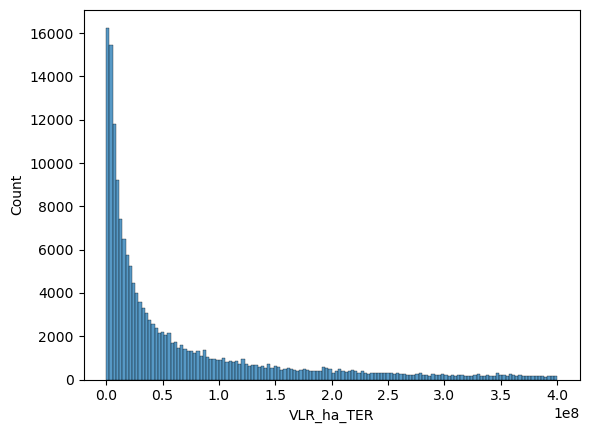

In [9]:
sns.histplot(data=df, x='VLR_ha_TER');

In [10]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

### Potencial Value (VP)VP is a numeric column. The minimum VP in the dataset is 6 and the maximum VP is 92. Thus, we can visualize the distribution of VP using a histogram  and a box plot. We'll use plotly to make the chart interactive.

In [11]:
df.ValorPotencial.describe()

count     169381
unique        23
top           30
freq       33820
Name: ValorPotencial, dtype: object

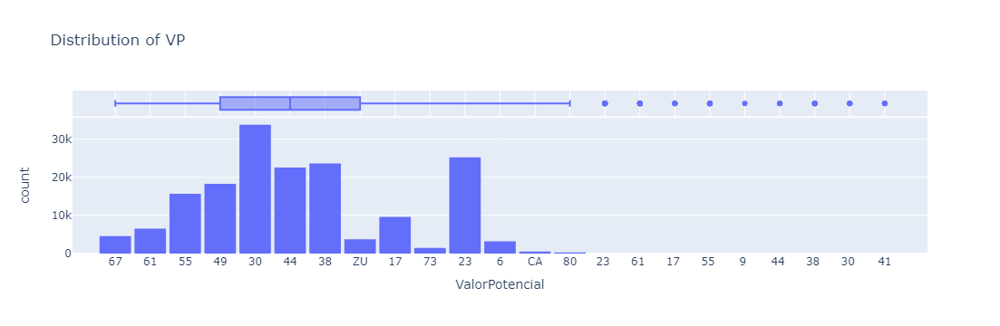

In [12]:
fig = px.histogram(df, 
                   x='ValorPotencial', 
                   
                   marginal='box', 
                   nbins=24, 
                   title='Distribution of VP')
fig.update_layout(bargap=0.1)
fig.show()

The distribution of VP in the dataset is not uniform, except for the VP 23 - 49, which seem to have uniform distribution

Let's explore some other columns

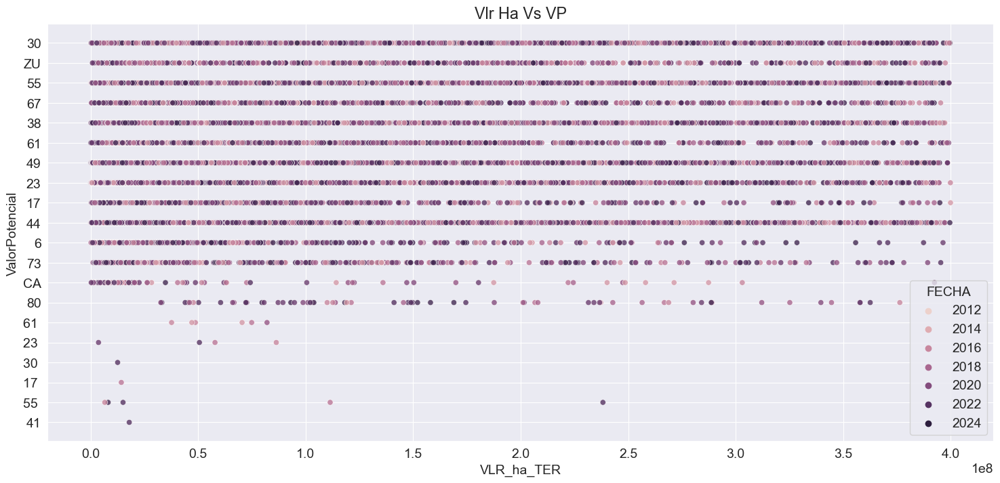

In [12]:
plt.figure(figsize=(18,8))
temp_df = df.sample(40000)
sns.scatterplot(x=temp_df.VLR_ha_TER, y=temp_df.ValorPotencial, hue=temp_df.FECHA, alpha=0.8)
plt.title("Vlr Ha Vs VP")
plt.show()

C:\Users\User\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Glyph 129 (\x81) missing from current font.



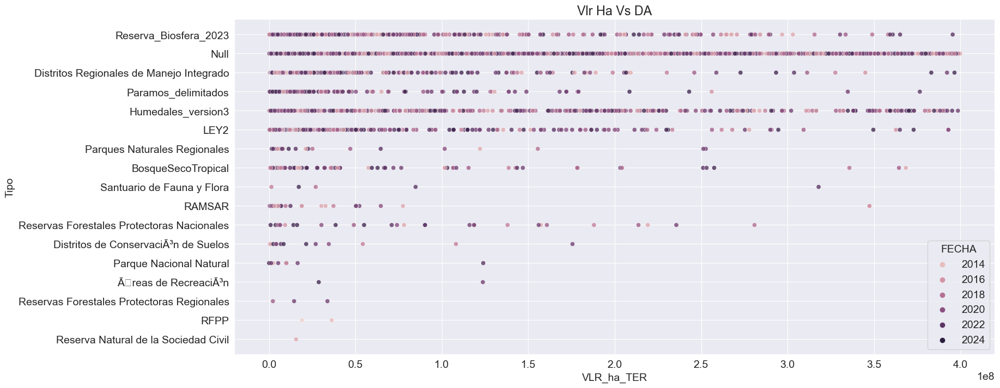

In [14]:
plt.figure(figsize=(18,8))
temp_df=df.sample(10000)
sns.scatterplot(x=temp_df.VLR_ha_TER, y=temp_df.Tipo, hue=temp_df.FECHA, alpha=0.8)
plt.title("Vlr Ha Vs DA")
plt.show()

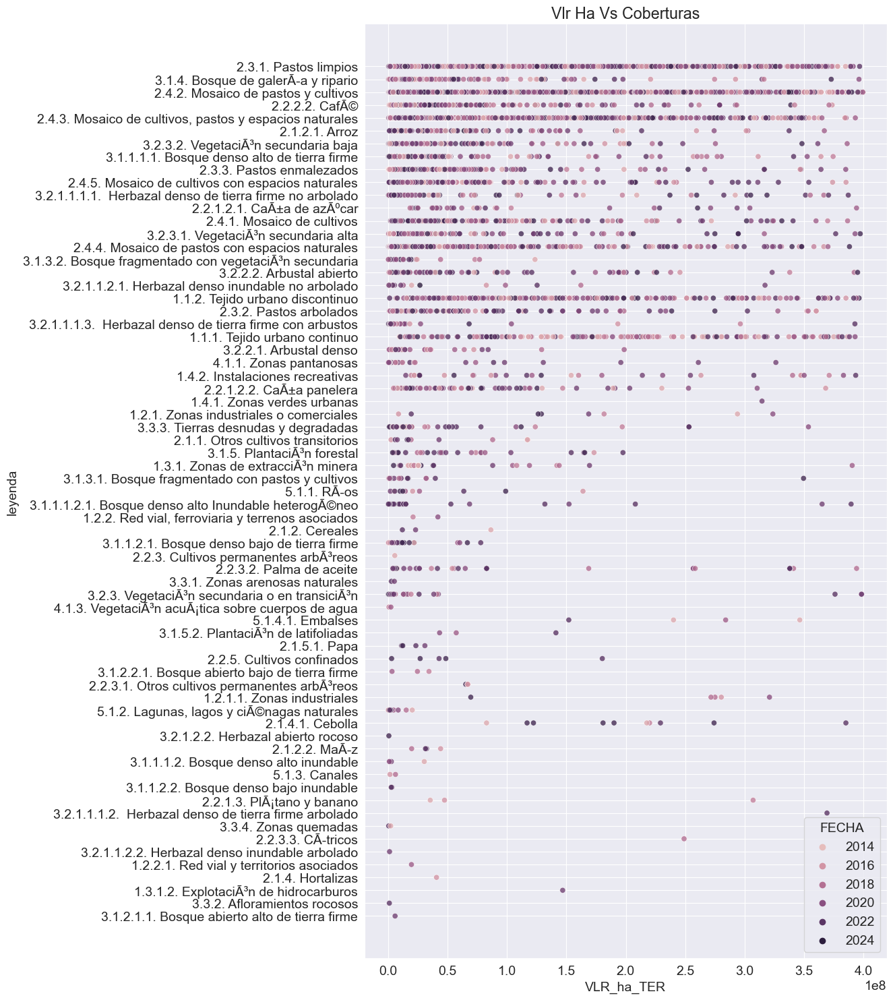

In [13]:
plt.figure(figsize=(10,18))
temp_df=df.sample(10000)
sns.scatterplot(x=temp_df.VLR_ha_TER, y=temp_df.leyenda, hue=temp_df.FECHA, alpha=0.8)
plt.title("Vlr Ha Vs Coberturas")
plt.show()

<Axes: xlabel='VLR_ha_TER', ylabel='Tipo'>

C:\Users\User\anaconda3\Lib\site-packages\IPython\core\events.py:82: UserWarning:

Glyph 129 (\x81) missing from current font.

C:\Users\User\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Glyph 129 (\x81) missing from current font.



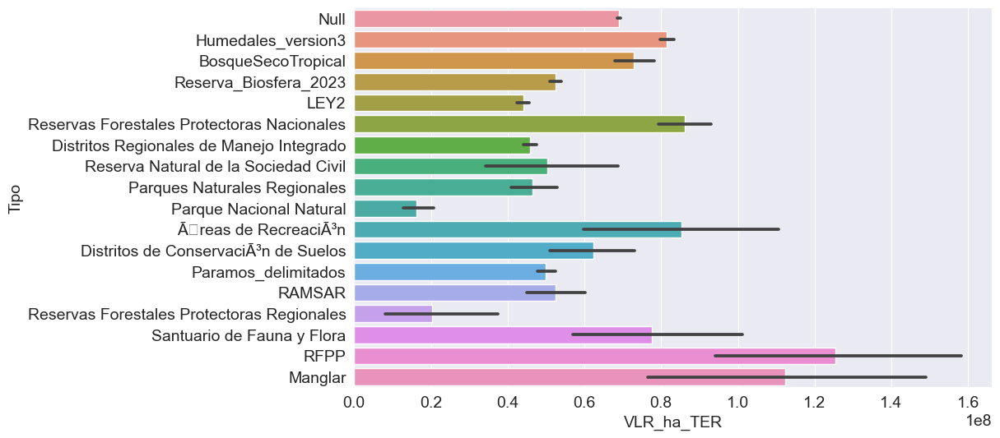

In [16]:
sns.barplot(data=df, x='VLR_ha_TER', y='Tipo')

## Correlation HeatMap

C:\Users\User\anaconda3\Lib\site-packages\seaborn\utils.py:80: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.draw()
C:\Users\User\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


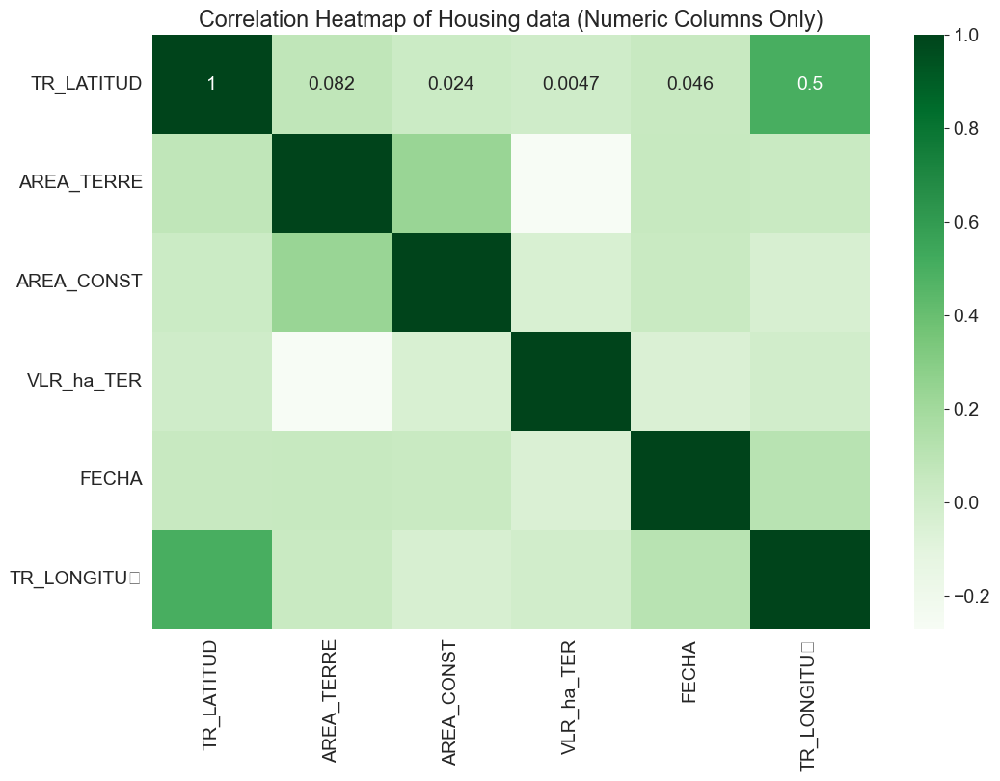

In [14]:
# Seleccionar solo las columnas numéricas
columnas_numericas = df.select_dtypes(include=['int', 'float'])

# Calcular la matriz de correlación solo para las columnas numéricas
correlation_matrix = columnas_numericas.corr()

# Visualizar la matriz de correlación en un heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='Greens')
plt.title('Correlation Heatmap of Housing data (Numeric Columns Only)')
plt.show()

In [22]:
columnas_numericas.corr()['VLR_ha_TER'].sort_values(ascending=False)

VLR_ha_TER      1.000000
TR_LATITUD      0.004715
TR_LONGITU\t   -0.006106
AREA_CONST     -0.037810
FECHA          -0.050729
AREA_TERRE     -0.270650
Name: VLR_ha_TER, dtype: float64

## Step 4 - Create a training/test/validation split and prepare the data for training

<img src="https://i.imgur.com/XZ9aP10.png" width="640">

### Train/Test/Validation Split

The data already contains a test set, which contaiof data after the end of the training set. We can apply a similar strategy to create a validation set. We'll the last 25% of rows for the validation set, after ordering by date

In [15]:
len(df)

169451

In [16]:
df.columns

Index(['ID', 'TR_LATITUD', 'TR_LONGITU', 'CODIGO_PRE', 'DESTINO_EC',
       'AREA_TERRE', 'AREA_CONST', 'VLR_ha_TER', 'FECHA', 'Vias_300m',
       'Aguas_300', 'leyenda', 'ValorPotencial', 'Tipo', 'TR_LONGITU\t'],
      dtype='object')

In [44]:
# Define your features (independent variables) and target (dependent variable)
features = ['TR_LATITUD', 'TR_LONGITU\t', 'Vias_300m', 'Aguas_300',
       'leyenda', 'ValorPotencial', 'Tipo','FECHA','AREA_TERRE','AREA_CONST']
target = ['VLR_ha_TER']

X = df[features]
y = df[target]

In [45]:
from sklearn.model_selection import train_test_split

# Dividir en entrenamiento (70%) y restante (30%)
X_train, X_remaining, y_train, y_remaining = train_test_split(X, y, test_size=0.3, random_state=42)

# Dividir el restante en prueba (15%) y validación (15%)
X_val, X_test, y_val, y_test = train_test_split(X_remaining, y_remaining, test_size=0.5, random_state=42)
print("Tamaño de X_train:", X_train.shape)
print("Tamaño de X_val:", X_val.shape)
print("Tamaño de X_test:", X_test.shape)

Tamaño de X_train: (118615, 10)
Tamaño de X_val: (25418, 10)
Tamaño de X_test: (25418, 10)


Let's also separate out numeric and categorical columns.

In [46]:
df[features].nunique()

TR_LATITUD        156658
TR_LONGITU\t      156662
Vias_300m              2
Aguas_300              2
leyenda               94
ValorPotencial        23
Tipo                  18
FECHA                 13
AREA_TERRE         47881
AREA_CONST           962
dtype: int64

In [47]:
train_inputs = X_train.copy()
train_targets = y_train.copy()

In [48]:
val_inputs = X_val.copy()
val_targets = y_val.copy()

In [49]:
test_inputs = X_test.copy()

Note that some columns can be treated as both numeric and categorical

In [53]:
numeric_cols = ['TR_LATITUD', 'TR_LONGITU\t','AREA_TERRE','AREA_CONST']
categorical_cols = ['Vias_300m', 'Aguas_300','leyenda', 'ValorPotencial', 'Tipo','FECHA']


### Imputation, Scaling and Encode

Let's impute missing data from numeric columns and scale the values to the $(0, 1)$ range. 

In [40]:
from sklearn.impute import SimpleImputer

In [54]:
imputer = SimpleImputer(strategy='mean').fit(train_inputs[numeric_cols])

In [55]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

Let's also scale the values to the $(0, 1)$ range.

In [56]:
from sklearn.preprocessing import MinMaxScaler

In [57]:
scaler = MinMaxScaler().fit(train_inputs[numeric_cols])

In [58]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

Finally, let's encode categorical columns as one-hot vectors.

In [59]:
from sklearn.preprocessing import OneHotEncoder

In [61]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore').fit(train_inputs[categorical_cols])
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))

In [62]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

C:\Users\User\AppData\Local\Temp\ipykernel_17484\1584174743.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
C:\Users\User\AppData\Local\Temp\ipykernel_17484\1584174743.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
C:\Users\User\AppData\Local\Temp\ipykernel_17484\1584174743.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of cal

Let's now extract out the numeric data.

In [63]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

## Step 5 - Create quick & easy baseline models to benchmark future models

<img src="https://i.imgur.com/1DLgiEz.png" width="640">

A quick baseline model helps establish the minimum score any ML model you train should achieve.


### Fixed/Random Guess

Let's define a model that always returns the mean value of Sales as the prediction.